In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST
from External.create_k_nearest import patch_together



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CC"

threshold = 12

# for the filename
parameters = "2-0_5-t12"

In [6]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

    
################################
###   apply the fitltering   ###
################################
from cluster_filter import cfilter
number_of_nodes = len(position)
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))

cluster_centers, labels, position, pca, embedding = cfilter(*k_means_pp(k, pca, return_labels=True), position, pca, embedding)
number_of_nodes = len(pca)
################################

unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 27.967262029647827
My own part is done: 0.9985473155975342
Time for data preperation:  94.84751105308533


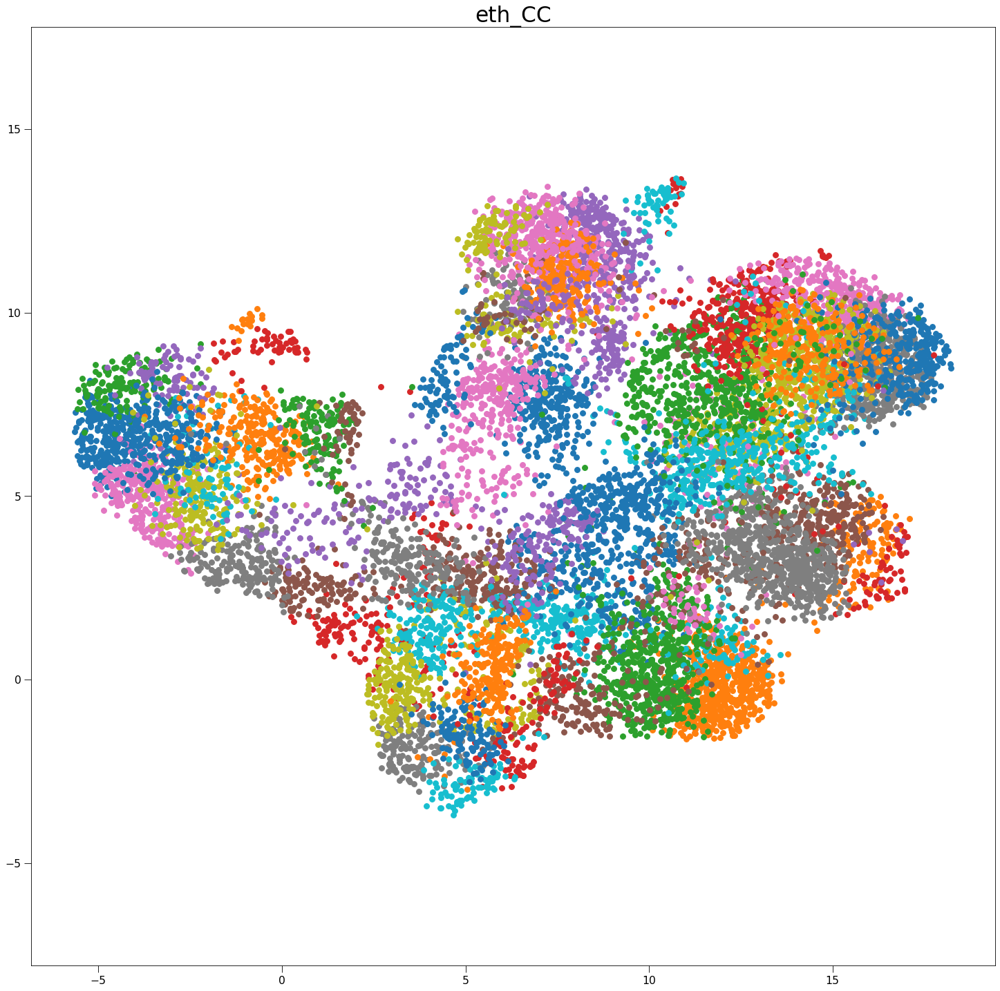

In [7]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
ax.get_legend().remove()
plt.show()

In [8]:
np.argsort([1,2,36])

0 not in [1,2,3]

True

In [9]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=11,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/81 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/67 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/618 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/618 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/618 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/66 [00:00<?, ?it/s]

update Arr 618 -> 559
update Arr 559 -> 508
update Arr 508 -> 433
update Arr 433 -> 393
update Arr 393 -> 353
update Arr 353 -> 316
update Arr 316 -> 279
update Arr 279 -> 249
update Arr 249 -> 225
update Arr 225 -> 198
update Arr 198 -> 171
update Arr 171 -> 148
update Arr 148 -> 134
update Arr 134 -> 110
update Arr 110 -> 96
update Arr 96 -> 85
update Arr 85 -> 77
update Arr 77 -> 75
update Arr 75 -> 73
update Arr 73 -> 71
update Arr 71 -> 69


calculating the densities for the density criterion:   0%|          | 0/554 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5475 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5475 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5475 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/553 [00:00<?, ?it/s]

update Arr 5475 -> 4914
added 3 edges early
update Arr 4914 -> 4464
update Arr 4464 -> 4047
update Arr 4047 -> 3678
update Arr 3678 -> 3338
update Arr 3338 -> 3033
update Arr 3033 -> 2757
update Arr 2757 -> 2502
update Arr 2502 -> 2270
update Arr 2270 -> 2063
update Arr 2063 -> 1871
update Arr 1871 -> 1690
update Arr 1690 -> 1528
update Arr 1528 -> 1387
update Arr 1387 -> 1259
update Arr 1259 -> 1138
update Arr 1138 -> 1028
update Arr 1028 -> 920
update Arr 920 -> 827
update Arr 827 -> 747
update Arr 747 -> 674
update Arr 674 -> 612
update Arr 612 -> 563
update Arr 563 -> 562
update Arr 562 -> 560
update Arr 560 -> 559
update Arr 559 -> 557
update Arr 557 -> 555
update Arr 555 -> 553


calculating the densities for the density criterion:   0%|          | 0/109 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1017 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1017 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1017 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 1017 -> 916
update Arr 916 -> 830
update Arr 830 -> 750
update Arr 750 -> 674
update Arr 674 -> 607
update Arr 607 -> 549
update Arr 549 -> 499
update Arr 499 -> 450
update Arr 450 -> 404
update Arr 404 -> 367
update Arr 367 -> 331
update Arr 331 -> 299
update Arr 299 -> 263
update Arr 263 -> 236
update Arr 236 -> 213
update Arr 213 -> 190
update Arr 190 -> 172
update Arr 172 -> 149
update Arr 149 -> 134
update Arr 134 -> 120
update Arr 120 -> 118
update Arr 118 -> 117
update Arr 117 -> 115
update Arr 115 -> 111
update Arr 111 -> 110
update Arr 110 -> 109


calculating the densities for the density criterion:   0%|          | 0/362 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3631 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3631 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3631 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/361 [00:00<?, ?it/s]

update Arr 3631 -> 3237
added 5 edges early
update Arr 3237 -> 2932
update Arr 2932 -> 2646
update Arr 2646 -> 2390
update Arr 2390 -> 2172
update Arr 2172 -> 1970
update Arr 1970 -> 1786
update Arr 1786 -> 1620
update Arr 1620 -> 1469
update Arr 1469 -> 1317
update Arr 1317 -> 1197
update Arr 1197 -> 1087
update Arr 1087 -> 985
update Arr 985 -> 894
update Arr 894 -> 811
update Arr 811 -> 728
update Arr 728 -> 660
update Arr 660 -> 596
update Arr 596 -> 538
update Arr 538 -> 489
update Arr 489 -> 443
update Arr 443 -> 402
update Arr 402 -> 371
update Arr 371 -> 367
update Arr 367 -> 366
update Arr 366 -> 365
update Arr 365 -> 364
update Arr 364 -> 363


calculating the densities for the density criterion:   0%|          | 0/278 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2781 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2781 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2781 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/277 [00:00<?, ?it/s]

update Arr 2781 -> 2520
update Arr 2520 -> 2271
update Arr 2271 -> 2060
update Arr 2060 -> 1836
update Arr 1836 -> 1665
update Arr 1665 -> 1509
update Arr 1509 -> 1370
update Arr 1370 -> 1244
update Arr 1244 -> 1119
update Arr 1119 -> 1015
update Arr 1015 -> 919
update Arr 919 -> 834
update Arr 834 -> 757
update Arr 757 -> 687
update Arr 687 -> 623
update Arr 623 -> 564
update Arr 564 -> 512
update Arr 512 -> 461
update Arr 461 -> 418
update Arr 418 -> 379
update Arr 379 -> 342
update Arr 342 -> 307
update Arr 307 -> 286
update Arr 286 -> 283
update Arr 283 -> 280
update Arr 280 -> 278
update Arr 278 -> 278


calculating the densities for the density criterion:   0%|          | 0/174 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1646 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1646 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1646 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/173 [00:00<?, ?it/s]

update Arr 1646 -> 1484
added 2 edges early
update Arr 1484 -> 1300
update Arr 1300 -> 1175
update Arr 1175 -> 1064
update Arr 1064 -> 962
update Arr 962 -> 873
update Arr 873 -> 791
update Arr 791 -> 719
update Arr 719 -> 651
update Arr 651 -> 589
update Arr 589 -> 535
update Arr 535 -> 482
update Arr 482 -> 438
update Arr 438 -> 398
update Arr 398 -> 359
update Arr 359 -> 322
update Arr 322 -> 288
update Arr 288 -> 253
update Arr 253 -> 228
update Arr 228 -> 200
update Arr 200 -> 181
update Arr 181 -> 177
update Arr 177 -> 176
update Arr 176 -> 175
update Arr 175 -> 174


calculating the densities for the density criterion:   0%|          | 0/82 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/745 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/745 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/745 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/81 [00:00<?, ?it/s]

update Arr 745 -> 669
update Arr 669 -> 606
update Arr 606 -> 525
update Arr 525 -> 471
update Arr 471 -> 426
update Arr 426 -> 382
update Arr 382 -> 346
update Arr 346 -> 302
update Arr 302 -> 265
update Arr 265 -> 236
update Arr 236 -> 211
update Arr 211 -> 188
update Arr 188 -> 162
update Arr 162 -> 147
update Arr 147 -> 124
update Arr 124 -> 110
update Arr 110 -> 97
update Arr 97 -> 91
update Arr 91 -> 89
update Arr 89 -> 88
update Arr 88 -> 85
update Arr 85 -> 84
update Arr 84 -> 82
update Arr 82 -> 82


calculating the densities for the density criterion:   0%|          | 0/96 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/923 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/923 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/923 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/95 [00:00<?, ?it/s]

update Arr 923 -> 777
update Arr 777 -> 704
update Arr 704 -> 639
update Arr 639 -> 574
update Arr 574 -> 516
update Arr 516 -> 463
update Arr 463 -> 419
update Arr 419 -> 371
update Arr 371 -> 335
update Arr 335 -> 300
update Arr 300 -> 272
update Arr 272 -> 243
update Arr 243 -> 219
update Arr 219 -> 198
update Arr 198 -> 169
update Arr 169 -> 153
update Arr 153 -> 138
update Arr 138 -> 120
update Arr 120 -> 107
update Arr 107 -> 104
update Arr 104 -> 101
update Arr 101 -> 98
update Arr 98 -> 96
update Arr 96 -> 95


calculating the densities for the density criterion:   0%|          | 0/140 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1385 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1385 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1385 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/139 [00:00<?, ?it/s]

update Arr 1385 -> 1256
update Arr 1256 -> 1117
update Arr 1117 -> 969
update Arr 969 -> 854
update Arr 854 -> 769
update Arr 769 -> 698
update Arr 698 -> 626
update Arr 626 -> 568
update Arr 568 -> 505
update Arr 505 -> 455
update Arr 455 -> 412
update Arr 412 -> 362
update Arr 362 -> 327
update Arr 327 -> 295
update Arr 295 -> 256
update Arr 256 -> 225
update Arr 225 -> 198
update Arr 198 -> 176
update Arr 176 -> 151
update Arr 151 -> 149
update Arr 149 -> 148
update Arr 148 -> 147
update Arr 147 -> 146
update Arr 146 -> 144
update Arr 144 -> 142
update Arr 142 -> 141
update Arr 141 -> 140


calculating the densities for the density criterion:   0%|          | 0/275 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2696 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2696 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2696 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/274 [00:00<?, ?it/s]

update Arr 2696 -> 2445
added 3 edges early
update Arr 2445 -> 2189
update Arr 2189 -> 1988
update Arr 1988 -> 1802
update Arr 1802 -> 1638
update Arr 1638 -> 1486
update Arr 1486 -> 1349
update Arr 1349 -> 1223
update Arr 1223 -> 1103
update Arr 1103 -> 999
update Arr 999 -> 903
update Arr 903 -> 816
update Arr 816 -> 741
update Arr 741 -> 671
update Arr 671 -> 605
update Arr 605 -> 541
update Arr 541 -> 490
update Arr 490 -> 439
update Arr 439 -> 396
update Arr 396 -> 355
update Arr 355 -> 315
update Arr 315 -> 286
update Arr 286 -> 283
update Arr 283 -> 278
update Arr 278 -> 276
update Arr 276 -> 275
update Arr 275 -> 275


calculating the densities for the density criterion:   0%|          | 0/120 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1163 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 1163 -> 1044
update Arr 1044 -> 945
update Arr 945 -> 846
update Arr 846 -> 766
update Arr 766 -> 692
update Arr 692 -> 628
update Arr 628 -> 568
update Arr 568 -> 508
update Arr 508 -> 458
update Arr 458 -> 416
update Arr 416 -> 370
update Arr 370 -> 331
update Arr 331 -> 292
update Arr 292 -> 259
update Arr 259 -> 232
update Arr 232 -> 205
update Arr 205 -> 181
update Arr 181 -> 161
update Arr 161 -> 146
update Arr 146 -> 132
update Arr 132 -> 125
update Arr 125 -> 123
update Arr 123 -> 120
update Arr 120 -> 120


calculating the densities for the density criterion:   0%|          | 0/182 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1669 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1669 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1669 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/181 [00:00<?, ?it/s]

update Arr 1669 -> 1494
update Arr 1494 -> 1357
update Arr 1357 -> 1229
update Arr 1229 -> 1109
update Arr 1109 -> 1004
update Arr 1004 -> 912
update Arr 912 -> 826
update Arr 826 -> 750
update Arr 750 -> 679
update Arr 679 -> 613
update Arr 613 -> 555
update Arr 555 -> 498
update Arr 498 -> 450
update Arr 450 -> 407
update Arr 407 -> 367
update Arr 367 -> 332
update Arr 332 -> 296
update Arr 296 -> 267
update Arr 267 -> 241
update Arr 241 -> 219
update Arr 219 -> 198
update Arr 198 -> 191
update Arr 191 -> 188
update Arr 188 -> 186
update Arr 186 -> 184
update Arr 184 -> 182


calculating the densities for the density criterion:   0%|          | 0/185 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1724 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1724 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1724 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/184 [00:00<?, ?it/s]

update Arr 1724 -> 1529
update Arr 1529 -> 1356
update Arr 1356 -> 1230
update Arr 1230 -> 1117
update Arr 1117 -> 1015
update Arr 1015 -> 915
update Arr 915 -> 826
update Arr 826 -> 742
update Arr 742 -> 665
update Arr 665 -> 597
update Arr 597 -> 531
update Arr 531 -> 477
update Arr 477 -> 427
update Arr 427 -> 386
update Arr 386 -> 347
update Arr 347 -> 313
update Arr 313 -> 283
update Arr 283 -> 255
update Arr 255 -> 226
update Arr 226 -> 205
update Arr 205 -> 193
update Arr 193 -> 190
update Arr 190 -> 188
update Arr 188 -> 186
update Arr 186 -> 186
update Arr 186 -> 184


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1069 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1069 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1069 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 1069 -> 970
update Arr 970 -> 879
update Arr 879 -> 783
update Arr 783 -> 698
update Arr 698 -> 597
update Arr 597 -> 542
update Arr 542 -> 489
update Arr 489 -> 437
update Arr 437 -> 397
update Arr 397 -> 359
update Arr 359 -> 323
update Arr 323 -> 293
update Arr 293 -> 264
update Arr 264 -> 237
update Arr 237 -> 212
update Arr 212 -> 186
update Arr 186 -> 168
update Arr 168 -> 145
update Arr 145 -> 127
update Arr 127 -> 119
update Arr 119 -> 118
update Arr 118 -> 117
update Arr 117 -> 115
update Arr 115 -> 114
update Arr 114 -> 112


calculating the densities for the density criterion:   0%|          | 0/397 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3979 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3979 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3979 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/396 [00:00<?, ?it/s]

update Arr 3979 -> 3613
added 8 edges early
update Arr 3613 -> 3273
update Arr 3273 -> 2972
update Arr 2972 -> 2701
update Arr 2701 -> 2451
update Arr 2451 -> 2226
update Arr 2226 -> 2019
update Arr 2019 -> 1829
update Arr 1829 -> 1655
update Arr 1655 -> 1501
update Arr 1501 -> 1362
update Arr 1362 -> 1238
update Arr 1238 -> 1118
update Arr 1118 -> 1014
update Arr 1014 -> 913
update Arr 913 -> 819
update Arr 819 -> 744
update Arr 744 -> 674
update Arr 674 -> 612
update Arr 612 -> 555
update Arr 555 -> 503
update Arr 503 -> 455
update Arr 455 -> 413
update Arr 413 -> 403
update Arr 403 -> 398
update Arr 398 -> 398
update Arr 398 -> 396


calculating the densities for the density criterion:   0%|          | 0/164 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1525 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1525 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1525 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/163 [00:00<?, ?it/s]

update Arr 1525 -> 1371
update Arr 1371 -> 1244
update Arr 1244 -> 1125
update Arr 1125 -> 1014
update Arr 1014 -> 921
update Arr 921 -> 820
update Arr 820 -> 742
update Arr 742 -> 673
update Arr 673 -> 606
update Arr 606 -> 550
update Arr 550 -> 498
update Arr 498 -> 452
update Arr 452 -> 408
update Arr 408 -> 367
update Arr 367 -> 332
update Arr 332 -> 295
update Arr 295 -> 265
update Arr 265 -> 232
update Arr 232 -> 210
update Arr 210 -> 190
update Arr 190 -> 171
update Arr 171 -> 171
update Arr 171 -> 170
update Arr 170 -> 169
update Arr 169 -> 167
update Arr 167 -> 166
update Arr 166 -> 166
update Arr 166 -> 164


calculating the densities for the density criterion:   0%|          | 0/92 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/876 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/876 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/876 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/91 [00:00<?, ?it/s]

update Arr 876 -> 793
update Arr 793 -> 719
update Arr 719 -> 653
update Arr 653 -> 587
update Arr 587 -> 530
update Arr 530 -> 476
update Arr 476 -> 428
update Arr 428 -> 385
update Arr 385 -> 342
update Arr 342 -> 308
update Arr 308 -> 274
update Arr 274 -> 242
update Arr 242 -> 219
update Arr 219 -> 192
update Arr 192 -> 169
update Arr 169 -> 151
update Arr 151 -> 130
update Arr 130 -> 118
update Arr 118 -> 107
update Arr 107 -> 98
update Arr 98 -> 95
update Arr 95 -> 93
update Arr 93 -> 92


calculating the densities for the density criterion:   0%|          | 0/98 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/915 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/915 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/915 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/97 [00:00<?, ?it/s]

update Arr 915 -> 831
update Arr 831 -> 749
update Arr 749 -> 676
update Arr 676 -> 611
update Arr 611 -> 530
update Arr 530 -> 481
update Arr 481 -> 435
update Arr 435 -> 392
update Arr 392 -> 356
update Arr 356 -> 323
update Arr 323 -> 293
update Arr 293 -> 265
update Arr 265 -> 238
update Arr 238 -> 213
update Arr 213 -> 185
update Arr 185 -> 159
update Arr 159 -> 142
update Arr 142 -> 127
update Arr 127 -> 114
update Arr 114 -> 106
update Arr 106 -> 100
update Arr 100 -> 100
update Arr 100 -> 99
update Arr 99 -> 99


calculating the densities for the density criterion:   0%|          | 0/87 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/757 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/757 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/757 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/86 [00:00<?, ?it/s]

update Arr 757 -> 672
update Arr 672 -> 603
update Arr 603 -> 547
update Arr 547 -> 492
update Arr 492 -> 441
update Arr 441 -> 395
update Arr 395 -> 358
update Arr 358 -> 319
update Arr 319 -> 282
update Arr 282 -> 249
update Arr 249 -> 220
update Arr 220 -> 197
update Arr 197 -> 170
update Arr 170 -> 153
update Arr 153 -> 139
update Arr 139 -> 123
update Arr 123 -> 110
update Arr 110 -> 97
update Arr 97 -> 93
update Arr 93 -> 91
update Arr 91 -> 87
update Arr 87 -> 87
update Arr 87 -> 86


calculating the densities for the density criterion:   0%|          | 0/250 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2386 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2386 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2386 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/249 [00:00<?, ?it/s]

update Arr 2386 -> 2147
added 3 edges early
update Arr 2147 -> 1940
update Arr 1940 -> 1762
update Arr 1762 -> 1596
update Arr 1596 -> 1445
update Arr 1445 -> 1313
update Arr 1313 -> 1187
update Arr 1187 -> 1072
update Arr 1072 -> 965
update Arr 965 -> 872
update Arr 872 -> 788
update Arr 788 -> 710
update Arr 710 -> 642
update Arr 642 -> 576
update Arr 576 -> 522
update Arr 522 -> 468
update Arr 468 -> 420
update Arr 420 -> 380
update Arr 380 -> 338
update Arr 338 -> 295
update Arr 295 -> 262
added 2 edges early
update Arr 262 -> 259
update Arr 259 -> 258
update Arr 258 -> 257
update Arr 257 -> 256
update Arr 256 -> 255
update Arr 255 -> 254
update Arr 254 -> 253
update Arr 253 -> 252
update Arr 252 -> 251
update Arr 251 -> 250
update Arr 250 -> 249


calculating the densities for the density criterion:   0%|          | 0/134 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1329 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1329 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1329 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/133 [00:00<?, ?it/s]

update Arr 1329 -> 1202
update Arr 1202 -> 1045
update Arr 1045 -> 944
update Arr 944 -> 840
update Arr 840 -> 753
update Arr 753 -> 680
update Arr 680 -> 612
update Arr 612 -> 555
update Arr 555 -> 504
update Arr 504 -> 454
update Arr 454 -> 412
update Arr 412 -> 369
update Arr 369 -> 332
update Arr 332 -> 296
update Arr 296 -> 263
update Arr 263 -> 237
update Arr 237 -> 212
update Arr 212 -> 192
update Arr 192 -> 171
update Arr 171 -> 150
update Arr 150 -> 142
update Arr 142 -> 138
update Arr 138 -> 136
update Arr 136 -> 134
update Arr 134 -> 133


calculating the densities for the density criterion:   0%|          | 0/230 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2192 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/229 [00:00<?, ?it/s]

update Arr 2192 -> 1967
added 3 edges early
update Arr 1967 -> 1771
update Arr 1771 -> 1591
update Arr 1591 -> 1441
update Arr 1441 -> 1307
update Arr 1307 -> 1188
update Arr 1188 -> 1078
update Arr 1078 -> 974
update Arr 974 -> 877
update Arr 877 -> 797
update Arr 797 -> 722
update Arr 722 -> 655
update Arr 655 -> 592
update Arr 592 -> 538
update Arr 538 -> 489
update Arr 489 -> 438
update Arr 438 -> 398
update Arr 398 -> 356
update Arr 356 -> 322
update Arr 322 -> 290
update Arr 290 -> 258
update Arr 258 -> 238
update Arr 238 -> 236
update Arr 236 -> 230
update Arr 230 -> 230
update Arr 230 -> 229


calculating the densities for the density criterion:   0%|          | 0/162 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1561 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1561 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1561 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/161 [00:00<?, ?it/s]

update Arr 1561 -> 1395
update Arr 1395 -> 1262
update Arr 1262 -> 1145
update Arr 1145 -> 1039
update Arr 1039 -> 930
update Arr 930 -> 841
update Arr 841 -> 764
update Arr 764 -> 694
update Arr 694 -> 630
update Arr 630 -> 572
update Arr 572 -> 516
update Arr 516 -> 465
update Arr 465 -> 417
update Arr 417 -> 370
update Arr 370 -> 331
update Arr 331 -> 297
update Arr 297 -> 266
update Arr 266 -> 239
update Arr 239 -> 211
update Arr 211 -> 187
update Arr 187 -> 166
added 4 edges early
update Arr 166 -> 166
update Arr 166 -> 164
update Arr 164 -> 164
update Arr 164 -> 162
update Arr 162 -> 162
update Arr 162 -> 161


calculating the densities for the density criterion:   0%|          | 0/117 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/991 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/991 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/991 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/116 [00:00<?, ?it/s]

update Arr 991 -> 893
update Arr 893 -> 803
update Arr 803 -> 728
update Arr 728 -> 654
update Arr 654 -> 592
update Arr 592 -> 533
update Arr 533 -> 482
update Arr 482 -> 434
update Arr 434 -> 393
update Arr 393 -> 353
update Arr 353 -> 319
update Arr 319 -> 282
update Arr 282 -> 256
update Arr 256 -> 231
update Arr 231 -> 209
update Arr 209 -> 187
update Arr 187 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 123
update Arr 123 -> 119
update Arr 119 -> 119
update Arr 119 -> 118
update Arr 118 -> 117


calculating the densities for the density criterion:   0%|          | 0/170 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1583 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1583 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1583 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/169 [00:00<?, ?it/s]

update Arr 1583 -> 1435
update Arr 1435 -> 1282
update Arr 1282 -> 1165
update Arr 1165 -> 1059
update Arr 1059 -> 957
update Arr 957 -> 864
update Arr 864 -> 785
update Arr 785 -> 708
update Arr 708 -> 638
update Arr 638 -> 574
update Arr 574 -> 518
update Arr 518 -> 468
update Arr 468 -> 424
update Arr 424 -> 377
update Arr 377 -> 339
update Arr 339 -> 302
update Arr 302 -> 269
update Arr 269 -> 242
update Arr 242 -> 219
update Arr 219 -> 194
update Arr 194 -> 179
update Arr 179 -> 176
update Arr 176 -> 174
update Arr 174 -> 172
update Arr 172 -> 170


calculating the densities for the density criterion:   0%|          | 0/13 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/77 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 49
update Arr 49 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 13


calculating the densities for the density criterion:   0%|          | 0/155 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1381 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1381 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1381 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/154 [00:00<?, ?it/s]

update Arr 1381 -> 1255
update Arr 1255 -> 1119
update Arr 1119 -> 1017
update Arr 1017 -> 922
update Arr 922 -> 834
update Arr 834 -> 754
update Arr 754 -> 683
update Arr 683 -> 619
update Arr 619 -> 558
update Arr 558 -> 503
update Arr 503 -> 456
update Arr 456 -> 406
update Arr 406 -> 368
update Arr 368 -> 332
update Arr 332 -> 293
update Arr 293 -> 264
update Arr 264 -> 230
update Arr 230 -> 207
update Arr 207 -> 188
update Arr 188 -> 167
update Arr 167 -> 163
update Arr 163 -> 161
update Arr 161 -> 157
update Arr 157 -> 157
update Arr 157 -> 156
update Arr 156 -> 155


calculating the densities for the density criterion:   0%|          | 0/50 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/462 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/462 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/462 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 462 -> 419
update Arr 419 -> 380
update Arr 380 -> 344
update Arr 344 -> 309
update Arr 309 -> 277
update Arr 277 -> 243
update Arr 243 -> 220
update Arr 220 -> 194
update Arr 194 -> 168
update Arr 168 -> 151
update Arr 151 -> 131
update Arr 131 -> 112
update Arr 112 -> 100
update Arr 100 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 62
update Arr 62 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
update Arr 56 -> 52
update Arr 52 -> 50
update Arr 50 -> 49


calculating the densities for the density criterion:   0%|          | 0/253 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2481 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2481 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2481 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/252 [00:00<?, ?it/s]

update Arr 2481 -> 2244
added 3 edges early
update Arr 2244 -> 2021
update Arr 2021 -> 1831
update Arr 1831 -> 1663
update Arr 1663 -> 1499
update Arr 1499 -> 1355
update Arr 1355 -> 1228
update Arr 1228 -> 1113
update Arr 1113 -> 1008
update Arr 1008 -> 910
update Arr 910 -> 823
update Arr 823 -> 745
update Arr 745 -> 674
update Arr 674 -> 612
update Arr 612 -> 551
update Arr 551 -> 497
update Arr 497 -> 451
update Arr 451 -> 408
update Arr 408 -> 368
update Arr 368 -> 326
update Arr 326 -> 295
update Arr 295 -> 265
update Arr 265 -> 261
update Arr 261 -> 260
update Arr 260 -> 258
update Arr 258 -> 256
update Arr 256 -> 255
update Arr 255 -> 254


calculating the densities for the density criterion:   0%|          | 0/122 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1125 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/121 [00:00<?, ?it/s]

update Arr 1125 -> 1016
added 2 edges early
update Arr 1016 -> 907
update Arr 907 -> 817
update Arr 817 -> 739
update Arr 739 -> 668
update Arr 668 -> 601
update Arr 601 -> 545
update Arr 545 -> 492
update Arr 492 -> 447
update Arr 447 -> 403
update Arr 403 -> 364
update Arr 364 -> 328
update Arr 328 -> 293
update Arr 293 -> 261
update Arr 261 -> 235
update Arr 235 -> 213
update Arr 213 -> 192
update Arr 192 -> 174
update Arr 174 -> 158
update Arr 158 -> 140
update Arr 140 -> 130
update Arr 130 -> 128
update Arr 128 -> 126
update Arr 126 -> 123
update Arr 123 -> 122
update Arr 122 -> 122


calculating the densities for the density criterion:   0%|          | 0/81 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/790 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/790 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/790 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 790 -> 709
update Arr 709 -> 638
update Arr 638 -> 568
update Arr 568 -> 515
update Arr 515 -> 462
update Arr 462 -> 411
update Arr 411 -> 365
update Arr 365 -> 330
update Arr 330 -> 295
update Arr 295 -> 266
update Arr 266 -> 241
update Arr 241 -> 219
update Arr 219 -> 198
update Arr 198 -> 177
update Arr 177 -> 158
update Arr 158 -> 139
update Arr 139 -> 125
update Arr 125 -> 111
update Arr 111 -> 98
update Arr 98 -> 90
update Arr 90 -> 89
update Arr 89 -> 86
update Arr 86 -> 84
update Arr 84 -> 83
update Arr 83 -> 81


calculating the densities for the density criterion:   0%|          | 0/428 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4377 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4377 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4377 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/427 [00:00<?, ?it/s]

update Arr 4377 -> 3956
added 4 edges early
update Arr 3956 -> 3596
update Arr 3596 -> 3252
update Arr 3252 -> 2954
update Arr 2954 -> 2682
update Arr 2682 -> 2436
update Arr 2436 -> 2208
update Arr 2208 -> 2001
update Arr 2001 -> 1808
update Arr 1808 -> 1643
update Arr 1643 -> 1489
update Arr 1489 -> 1353
update Arr 1353 -> 1224
update Arr 1224 -> 1107
update Arr 1107 -> 996
update Arr 996 -> 905
update Arr 905 -> 818
update Arr 818 -> 742
update Arr 742 -> 668
update Arr 668 -> 595
update Arr 595 -> 538
update Arr 538 -> 486
update Arr 486 -> 439
update Arr 439 -> 433
update Arr 433 -> 433
update Arr 433 -> 431
update Arr 431 -> 429
update Arr 429 -> 428


calculating the densities for the density criterion:   0%|          | 0/61 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/573 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/573 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/573 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 573 -> 511
update Arr 511 -> 458
update Arr 458 -> 410
update Arr 410 -> 370
update Arr 370 -> 309
update Arr 309 -> 276
update Arr 276 -> 245
update Arr 245 -> 219
update Arr 219 -> 196
update Arr 196 -> 171
update Arr 171 -> 148
update Arr 148 -> 130
update Arr 130 -> 118
update Arr 118 -> 103
update Arr 103 -> 91
update Arr 91 -> 79
update Arr 79 -> 69
update Arr 69 -> 67
update Arr 67 -> 64
update Arr 64 -> 62
update Arr 62 -> 61


calculating the densities for the density criterion:   0%|          | 0/138 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1302 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1302 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1302 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/137 [00:00<?, ?it/s]

update Arr 1302 -> 1178
update Arr 1178 -> 1058
update Arr 1058 -> 940
update Arr 940 -> 848
update Arr 848 -> 766
update Arr 766 -> 694
update Arr 694 -> 620
update Arr 620 -> 559
update Arr 559 -> 503
update Arr 503 -> 456
update Arr 456 -> 408
update Arr 408 -> 370
update Arr 370 -> 335
update Arr 335 -> 304
update Arr 304 -> 271
update Arr 271 -> 241
update Arr 241 -> 216
update Arr 216 -> 191
update Arr 191 -> 173
update Arr 173 -> 154
update Arr 154 -> 144
update Arr 144 -> 144
update Arr 144 -> 143
update Arr 143 -> 142
update Arr 142 -> 142
update Arr 142 -> 140
update Arr 140 -> 140
update Arr 140 -> 137


calculating the densities for the density criterion:   0%|          | 0/16 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/109 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 78
update Arr 78 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 17
update Arr 17 -> 16


calculating the densities for the density criterion:   0%|          | 0/14 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/88 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/88 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/88 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 88 -> 78
update Arr 78 -> 68
update Arr 68 -> 58
update Arr 58 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 16
update Arr 16 -> 14


calculating the densities for the density criterion:   0%|          | 0/241 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2390 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2390 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2390 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/240 [00:00<?, ?it/s]

update Arr 2390 -> 2160
added 6 edges early
update Arr 2160 -> 1944
update Arr 1944 -> 1760
update Arr 1760 -> 1598
update Arr 1598 -> 1446
update Arr 1446 -> 1307
update Arr 1307 -> 1183
update Arr 1183 -> 1073
update Arr 1073 -> 971
update Arr 971 -> 878
update Arr 878 -> 796
update Arr 796 -> 722
update Arr 722 -> 652
update Arr 652 -> 588
update Arr 588 -> 532
update Arr 532 -> 483
update Arr 483 -> 431
update Arr 431 -> 391
update Arr 391 -> 350
update Arr 350 -> 318
update Arr 318 -> 288
update Arr 288 -> 260
update Arr 260 -> 250
update Arr 250 -> 249
update Arr 249 -> 247
update Arr 247 -> 243
update Arr 243 -> 243
update Arr 243 -> 242


calculating the densities for the density criterion:   0%|          | 0/204 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1950 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1950 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1950 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/203 [00:00<?, ?it/s]

update Arr 1950 -> 1747
added 2 edges early
update Arr 1747 -> 1557
update Arr 1557 -> 1409
update Arr 1409 -> 1279
update Arr 1279 -> 1156
update Arr 1156 -> 1048
update Arr 1048 -> 947
update Arr 947 -> 855
update Arr 855 -> 776
update Arr 776 -> 702
update Arr 702 -> 636
update Arr 636 -> 575
update Arr 575 -> 521
update Arr 521 -> 473
update Arr 473 -> 427
update Arr 427 -> 387
update Arr 387 -> 348
update Arr 348 -> 315
update Arr 315 -> 286
update Arr 286 -> 258
update Arr 258 -> 231
update Arr 231 -> 213
update Arr 213 -> 212
update Arr 212 -> 211
update Arr 211 -> 209
update Arr 209 -> 207
update Arr 207 -> 205
update Arr 205 -> 204


calculating the densities for the density criterion:   0%|          | 0/223 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2167 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/222 [00:00<?, ?it/s]

update Arr 2167 -> 1969
update Arr 1969 -> 1777
update Arr 1777 -> 1613
update Arr 1613 -> 1464
update Arr 1464 -> 1323
update Arr 1323 -> 1195
update Arr 1195 -> 1079
update Arr 1079 -> 975
update Arr 975 -> 883
update Arr 883 -> 795
update Arr 795 -> 713
update Arr 713 -> 644
update Arr 644 -> 583
update Arr 583 -> 525
update Arr 525 -> 477
update Arr 477 -> 429
update Arr 429 -> 389
update Arr 389 -> 351
update Arr 351 -> 319
update Arr 319 -> 286
update Arr 286 -> 255
update Arr 255 -> 232
update Arr 232 -> 232
update Arr 232 -> 229
update Arr 229 -> 226
update Arr 226 -> 226
update Arr 226 -> 225


calculating the densities for the density criterion:   0%|          | 0/81 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/741 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/741 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/741 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 741 -> 664
update Arr 664 -> 600
update Arr 600 -> 537
update Arr 537 -> 484
update Arr 484 -> 439
update Arr 439 -> 392
update Arr 392 -> 349
update Arr 349 -> 315
update Arr 315 -> 281
update Arr 281 -> 250
update Arr 250 -> 223
update Arr 223 -> 198
update Arr 198 -> 178
update Arr 178 -> 160
update Arr 160 -> 142
update Arr 142 -> 126
update Arr 126 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 88
update Arr 88 -> 84
update Arr 84 -> 83


calculating the densities for the density criterion:   0%|          | 0/206 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1968 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1968 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1968 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/205 [00:00<?, ?it/s]

update Arr 1968 -> 1780
added 3 edges early
update Arr 1780 -> 1608
update Arr 1608 -> 1459
update Arr 1459 -> 1312
update Arr 1312 -> 1187
update Arr 1187 -> 1075
update Arr 1075 -> 976
update Arr 976 -> 881
update Arr 881 -> 799
update Arr 799 -> 723
update Arr 723 -> 650
update Arr 650 -> 588
update Arr 588 -> 524
update Arr 524 -> 470
update Arr 470 -> 422
update Arr 422 -> 383
update Arr 383 -> 345
update Arr 345 -> 313
update Arr 313 -> 282
update Arr 282 -> 255
update Arr 255 -> 223
update Arr 223 -> 215
update Arr 215 -> 213
update Arr 213 -> 211
update Arr 211 -> 208
update Arr 208 -> 206
update Arr 206 -> 205


calculating the densities for the density criterion:   0%|          | 0/130 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1177 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/129 [00:00<?, ?it/s]

update Arr 1177 -> 1060
update Arr 1060 -> 960
update Arr 960 -> 867
update Arr 867 -> 783
update Arr 783 -> 708
update Arr 708 -> 634
update Arr 634 -> 575
update Arr 575 -> 522
update Arr 522 -> 473
update Arr 473 -> 429
update Arr 429 -> 376
update Arr 376 -> 333
update Arr 333 -> 298
update Arr 298 -> 270
update Arr 270 -> 242
update Arr 242 -> 218
update Arr 218 -> 196
update Arr 196 -> 176
update Arr 176 -> 157
update Arr 157 -> 142
update Arr 142 -> 139
update Arr 139 -> 134
update Arr 134 -> 134
update Arr 134 -> 133
update Arr 133 -> 131
update Arr 131 -> 130


calculating the densities for the density criterion:   0%|          | 0/324 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3233 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/323 [00:00<?, ?it/s]

update Arr 3233 -> 2901
added 6 edges early
update Arr 2901 -> 2627
update Arr 2627 -> 2365
update Arr 2365 -> 2129
update Arr 2129 -> 1930
update Arr 1930 -> 1747
update Arr 1747 -> 1583
update Arr 1583 -> 1431
update Arr 1431 -> 1296
update Arr 1296 -> 1174
update Arr 1174 -> 1058
update Arr 1058 -> 952
update Arr 952 -> 861
update Arr 861 -> 782
update Arr 782 -> 710
update Arr 710 -> 637
update Arr 637 -> 579
update Arr 579 -> 523
update Arr 523 -> 474
update Arr 474 -> 428
update Arr 428 -> 389
update Arr 389 -> 349
update Arr 349 -> 333
update Arr 333 -> 332
update Arr 332 -> 329
update Arr 329 -> 327
update Arr 327 -> 326
update Arr 326 -> 324


calculating the densities for the density criterion:   0%|          | 0/95 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/869 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/869 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/869 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 869 -> 771
update Arr 771 -> 686
update Arr 686 -> 621
update Arr 621 -> 564
update Arr 564 -> 512
update Arr 512 -> 462
update Arr 462 -> 417
update Arr 417 -> 376
update Arr 376 -> 341
update Arr 341 -> 303
update Arr 303 -> 270
update Arr 270 -> 242
update Arr 242 -> 217
update Arr 217 -> 194
update Arr 194 -> 174
update Arr 174 -> 154
update Arr 154 -> 138
update Arr 138 -> 120
update Arr 120 -> 108
update Arr 108 -> 103
update Arr 103 -> 101
update Arr 101 -> 98
update Arr 98 -> 97


calculating the densities for the density criterion:   0%|          | 0/160 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1502 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1502 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1502 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/159 [00:00<?, ?it/s]

update Arr 1502 -> 1357
added 5 edges early
update Arr 1357 -> 1226
update Arr 1226 -> 1112
update Arr 1112 -> 1007
update Arr 1007 -> 913
update Arr 913 -> 825
update Arr 825 -> 743
update Arr 743 -> 666
update Arr 666 -> 605
update Arr 605 -> 548
update Arr 548 -> 494
update Arr 494 -> 446
update Arr 446 -> 402
update Arr 402 -> 362
update Arr 362 -> 324
update Arr 324 -> 290
update Arr 290 -> 262
update Arr 262 -> 236
update Arr 236 -> 211
update Arr 211 -> 191
update Arr 191 -> 171
update Arr 171 -> 167
update Arr 167 -> 164
update Arr 164 -> 163
update Arr 163 -> 161
update Arr 161 -> 160


calculating the densities for the density criterion:   0%|          | 0/311 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3048 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3048 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3048 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/310 [00:00<?, ?it/s]

update Arr 3048 -> 2767
added 2 edges early
update Arr 2767 -> 2512
update Arr 2512 -> 2281
update Arr 2281 -> 2061
update Arr 2061 -> 1866
update Arr 1866 -> 1692
update Arr 1692 -> 1535
update Arr 1535 -> 1390
update Arr 1390 -> 1263
update Arr 1263 -> 1141
update Arr 1141 -> 1032
update Arr 1032 -> 930
update Arr 930 -> 845
update Arr 845 -> 768
update Arr 768 -> 696
update Arr 696 -> 630
update Arr 630 -> 572
update Arr 572 -> 518
update Arr 518 -> 466
update Arr 466 -> 422
update Arr 422 -> 383
update Arr 383 -> 345
update Arr 345 -> 314
added 5 edges early
update Arr 314 -> 314
update Arr 314 -> 313
update Arr 313 -> 313
update Arr 313 -> 312
update Arr 312 -> 311
update Arr 311 -> 311


calculating the densities for the density criterion:   0%|          | 0/228 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2279 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2279 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2279 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/227 [00:00<?, ?it/s]

update Arr 2279 -> 2054
added 5 edges early
update Arr 2054 -> 1833
update Arr 1833 -> 1631
update Arr 1631 -> 1480
update Arr 1480 -> 1339
update Arr 1339 -> 1215
update Arr 1215 -> 1103
update Arr 1103 -> 997
update Arr 997 -> 904
update Arr 904 -> 818
update Arr 818 -> 740
update Arr 740 -> 665
update Arr 665 -> 597
update Arr 597 -> 531
update Arr 531 -> 478
update Arr 478 -> 432
update Arr 432 -> 390
update Arr 390 -> 353
update Arr 353 -> 319
update Arr 319 -> 289
update Arr 289 -> 259
update Arr 259 -> 237
update Arr 237 -> 236
update Arr 236 -> 235
update Arr 235 -> 229
added 2 edges early
update Arr 229 -> 229
update Arr 229 -> 228


calculating the densities for the density criterion:   0%|          | 0/66 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/613 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/613 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/613 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 613 -> 529
update Arr 529 -> 476
update Arr 476 -> 427
update Arr 427 -> 381
update Arr 381 -> 339
update Arr 339 -> 306
update Arr 306 -> 273
update Arr 273 -> 239
update Arr 239 -> 211
update Arr 211 -> 183
update Arr 183 -> 162
update Arr 162 -> 144
update Arr 144 -> 130
update Arr 130 -> 118
update Arr 118 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 75
update Arr 75 -> 72
update Arr 72 -> 70
update Arr 70 -> 68
update Arr 68 -> 66


calculating the densities for the density criterion:   0%|          | 0/416 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4220 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4220 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4220 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/415 [00:00<?, ?it/s]

update Arr 4220 -> 3760
added 5 edges early
update Arr 3760 -> 3403
update Arr 3403 -> 3073
update Arr 3073 -> 2791
update Arr 2791 -> 2517
update Arr 2517 -> 2283
update Arr 2283 -> 2071
update Arr 2071 -> 1880
update Arr 1880 -> 1703
update Arr 1703 -> 1545
update Arr 1545 -> 1404
update Arr 1404 -> 1272
update Arr 1272 -> 1154
update Arr 1154 -> 1049
update Arr 1049 -> 951
update Arr 951 -> 862
update Arr 862 -> 782
update Arr 782 -> 707
update Arr 707 -> 637
update Arr 637 -> 575
update Arr 575 -> 516
update Arr 516 -> 467
added 4 edges early
update Arr 467 -> 425
update Arr 425 -> 424
update Arr 424 -> 423
update Arr 423 -> 422
update Arr 422 -> 420
update Arr 420 -> 420
update Arr 420 -> 419
update Arr 419 -> 417
update Arr 417 -> 416


calculating the densities for the density criterion:   0%|          | 0/73 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/631 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/631 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/631 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 631 -> 561
update Arr 561 -> 493
update Arr 493 -> 423
update Arr 423 -> 384
update Arr 384 -> 349
update Arr 349 -> 317
update Arr 317 -> 286
update Arr 286 -> 252
update Arr 252 -> 227
update Arr 227 -> 205
update Arr 205 -> 180
update Arr 180 -> 162
update Arr 162 -> 145
update Arr 145 -> 124
update Arr 124 -> 108
update Arr 108 -> 96
update Arr 96 -> 84
update Arr 84 -> 79
update Arr 79 -> 76
update Arr 76 -> 74
update Arr 74 -> 73


calculating the densities for the density criterion:   0%|          | 0/161 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1549 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1549 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1549 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/160 [00:00<?, ?it/s]

update Arr 1549 -> 1398
update Arr 1398 -> 1260
update Arr 1260 -> 1127
update Arr 1127 -> 1021
update Arr 1021 -> 924
update Arr 924 -> 833
update Arr 833 -> 754
update Arr 754 -> 676
update Arr 676 -> 609
update Arr 609 -> 553
update Arr 553 -> 496
update Arr 496 -> 445
update Arr 445 -> 399
update Arr 399 -> 360
update Arr 360 -> 325
update Arr 325 -> 295
update Arr 295 -> 267
update Arr 267 -> 241
update Arr 241 -> 217
update Arr 217 -> 196
update Arr 196 -> 177
update Arr 177 -> 167
update Arr 167 -> 167
update Arr 167 -> 167
update Arr 167 -> 163
update Arr 163 -> 163
update Arr 163 -> 161


calculating the densities for the density criterion:   0%|          | 0/243 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2438 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2438 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2438 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/242 [00:00<?, ?it/s]

update Arr 2438 -> 2214
added 5 edges early
update Arr 2214 -> 2002
update Arr 2002 -> 1815
update Arr 1815 -> 1644
update Arr 1644 -> 1436
update Arr 1436 -> 1299
update Arr 1299 -> 1177
update Arr 1177 -> 1067
update Arr 1067 -> 968
update Arr 968 -> 875
update Arr 875 -> 791
update Arr 791 -> 716
update Arr 716 -> 644
update Arr 644 -> 584
update Arr 584 -> 529
update Arr 529 -> 474
update Arr 474 -> 422
update Arr 422 -> 383
update Arr 383 -> 348
update Arr 348 -> 316
update Arr 316 -> 286
update Arr 286 -> 255
update Arr 255 -> 249
update Arr 249 -> 249
update Arr 249 -> 248
update Arr 248 -> 248
update Arr 248 -> 246
update Arr 246 -> 244
update Arr 244 -> 243


calculating the densities for the density criterion:   0%|          | 0/43 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/398 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/398 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/398 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 398 -> 358
update Arr 358 -> 324
update Arr 324 -> 290
update Arr 290 -> 242
update Arr 242 -> 217
update Arr 217 -> 188
update Arr 188 -> 170
update Arr 170 -> 150
update Arr 150 -> 135
update Arr 135 -> 120
update Arr 120 -> 107
update Arr 107 -> 92
update Arr 92 -> 83
update Arr 83 -> 74
update Arr 74 -> 67
update Arr 67 -> 59
update Arr 59 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 43


calculating the densities for the density criterion:   0%|          | 0/15 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/99 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/99 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/99 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 99 -> 89
update Arr 89 -> 79
update Arr 79 -> 66
update Arr 66 -> 58
update Arr 58 -> 49
update Arr 49 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 15


calculating the densities for the density criterion:   0%|          | 0/210 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2063 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2063 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2063 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/209 [00:00<?, ?it/s]

update Arr 2063 -> 1792
update Arr 1792 -> 1599
update Arr 1599 -> 1451
update Arr 1451 -> 1314
update Arr 1314 -> 1190
update Arr 1190 -> 1074
update Arr 1074 -> 968
update Arr 968 -> 876
update Arr 876 -> 794
update Arr 794 -> 711
update Arr 711 -> 639
update Arr 639 -> 576
update Arr 576 -> 515
update Arr 515 -> 468
update Arr 468 -> 422
update Arr 422 -> 375
update Arr 375 -> 340
update Arr 340 -> 303
update Arr 303 -> 271
update Arr 271 -> 245
update Arr 245 -> 222
update Arr 222 -> 215
update Arr 215 -> 215
update Arr 215 -> 213
update Arr 213 -> 211
update Arr 211 -> 210


calculating the densities for the density criterion:   0%|          | 0/17 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/118 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 118 -> 107
update Arr 107 -> 97
update Arr 97 -> 84
update Arr 84 -> 70
update Arr 70 -> 60
update Arr 60 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 17


calculating the densities for the density criterion:   0%|          | 0/183 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1707 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1707 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1707 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/182 [00:00<?, ?it/s]

update Arr 1707 -> 1548
added 2 edges early
update Arr 1548 -> 1376
update Arr 1376 -> 1247
update Arr 1247 -> 1130
update Arr 1130 -> 1027
update Arr 1027 -> 927
update Arr 927 -> 840
update Arr 840 -> 762
update Arr 762 -> 680
update Arr 680 -> 611
update Arr 611 -> 555
update Arr 555 -> 499
update Arr 499 -> 447
update Arr 447 -> 402
update Arr 402 -> 361
update Arr 361 -> 327
update Arr 327 -> 296
update Arr 296 -> 262
update Arr 262 -> 235
update Arr 235 -> 212
update Arr 212 -> 190
update Arr 190 -> 187
update Arr 187 -> 186
update Arr 186 -> 185
update Arr 185 -> 183


calculating the densities for the density criterion:   0%|          | 0/150 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1440 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1440 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1440 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/149 [00:00<?, ?it/s]

update Arr 1440 -> 1279
update Arr 1279 -> 1155
update Arr 1155 -> 1049
update Arr 1049 -> 935
update Arr 935 -> 848
update Arr 848 -> 768
update Arr 768 -> 691
update Arr 691 -> 623
update Arr 623 -> 564
update Arr 564 -> 505
update Arr 505 -> 448
update Arr 448 -> 406
update Arr 406 -> 366
update Arr 366 -> 326
update Arr 326 -> 294
update Arr 294 -> 257
update Arr 257 -> 232
update Arr 232 -> 202
update Arr 202 -> 181
update Arr 181 -> 161
update Arr 161 -> 158
update Arr 158 -> 155
update Arr 155 -> 153
update Arr 153 -> 150


calculating the densities for the density criterion:   0%|          | 0/332 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3359 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3359 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3359 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/331 [00:00<?, ?it/s]

update Arr 3359 -> 3047
added 5 edges early
update Arr 3047 -> 2732
update Arr 2732 -> 2355
update Arr 2355 -> 2140
update Arr 2140 -> 1940
update Arr 1940 -> 1754
update Arr 1754 -> 1587
update Arr 1587 -> 1438
update Arr 1438 -> 1307
update Arr 1307 -> 1185
update Arr 1185 -> 1077
update Arr 1077 -> 974
update Arr 974 -> 882
update Arr 882 -> 793
update Arr 793 -> 716
update Arr 716 -> 646
update Arr 646 -> 586
update Arr 586 -> 532
update Arr 532 -> 481
update Arr 481 -> 430
update Arr 430 -> 389
update Arr 389 -> 350
update Arr 350 -> 340
update Arr 340 -> 336
update Arr 336 -> 334
update Arr 334 -> 333
update Arr 333 -> 332
update Arr 332 -> 331


calculating the densities for the density criterion:   0%|          | 0/174 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1596 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1596 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1596 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/173 [00:00<?, ?it/s]

update Arr 1596 -> 1446
update Arr 1446 -> 1299
update Arr 1299 -> 1176
update Arr 1176 -> 1064
update Arr 1064 -> 966
update Arr 966 -> 870
update Arr 870 -> 788
update Arr 788 -> 714
update Arr 714 -> 645
update Arr 645 -> 584
update Arr 584 -> 529
update Arr 529 -> 479
update Arr 479 -> 433
update Arr 433 -> 392
update Arr 392 -> 354
update Arr 354 -> 321
update Arr 321 -> 290
update Arr 290 -> 263
update Arr 263 -> 237
update Arr 237 -> 213
update Arr 213 -> 191
update Arr 191 -> 183
update Arr 183 -> 182
update Arr 182 -> 177
update Arr 177 -> 177
update Arr 177 -> 175
update Arr 175 -> 174


calculating the densities for the density criterion:   0%|          | 0/184 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1818 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1818 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1818 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/183 [00:00<?, ?it/s]

update Arr 1818 -> 1642
added 3 edges early
update Arr 1642 -> 1491
update Arr 1491 -> 1343
update Arr 1343 -> 1218
update Arr 1218 -> 1103
update Arr 1103 -> 999
update Arr 999 -> 906
update Arr 906 -> 818
update Arr 818 -> 728
update Arr 728 -> 658
update Arr 658 -> 596
update Arr 596 -> 534
update Arr 534 -> 482
update Arr 482 -> 432
update Arr 432 -> 392
update Arr 392 -> 352
update Arr 352 -> 318
update Arr 318 -> 286
update Arr 286 -> 250
update Arr 250 -> 224
update Arr 224 -> 195
update Arr 195 -> 193
update Arr 193 -> 192
update Arr 192 -> 188
update Arr 188 -> 187
update Arr 187 -> 186
update Arr 186 -> 185
update Arr 185 -> 184


calculating the densities for the density criterion:   0%|          | 0/234 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2325 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2325 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2325 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/233 [00:00<?, ?it/s]

update Arr 2325 -> 2113
added 2 edges early
update Arr 2113 -> 1898
update Arr 1898 -> 1722
update Arr 1722 -> 1554
update Arr 1554 -> 1410
update Arr 1410 -> 1279
update Arr 1279 -> 1161
update Arr 1161 -> 1052
update Arr 1052 -> 951
update Arr 951 -> 861
update Arr 861 -> 776
update Arr 776 -> 703
update Arr 703 -> 636
update Arr 636 -> 577
update Arr 577 -> 520
update Arr 520 -> 467
update Arr 467 -> 422
update Arr 422 -> 381
update Arr 381 -> 345
update Arr 345 -> 310
update Arr 310 -> 277
update Arr 277 -> 242
update Arr 242 -> 242
update Arr 242 -> 241
update Arr 241 -> 240
update Arr 240 -> 239
update Arr 239 -> 238
update Arr 238 -> 237
update Arr 237 -> 236
update Arr 236 -> 236
update Arr 236 -> 234


calculating the densities for the density criterion:   0%|          | 0/198 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1877 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1877 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1877 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/197 [00:00<?, ?it/s]

update Arr 1877 -> 1686
update Arr 1686 -> 1513
update Arr 1513 -> 1374
update Arr 1374 -> 1249
update Arr 1249 -> 1128
update Arr 1128 -> 1024
update Arr 1024 -> 925
update Arr 925 -> 840
update Arr 840 -> 756
update Arr 756 -> 682
update Arr 682 -> 617
update Arr 617 -> 558
update Arr 558 -> 504
update Arr 504 -> 458
update Arr 458 -> 410
update Arr 410 -> 372
update Arr 372 -> 335
update Arr 335 -> 303
update Arr 303 -> 273
update Arr 273 -> 247
update Arr 247 -> 222
update Arr 222 -> 204
update Arr 204 -> 201
update Arr 201 -> 198
update Arr 198 -> 198


calculating the densities for the density criterion:   0%|          | 0/15 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/99 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/99 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/99 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 99 -> 89
update Arr 89 -> 79
update Arr 79 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 16


calculating the densities for the density criterion:   0%|          | 0/437 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4295 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4295 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4295 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/436 [00:00<?, ?it/s]

update Arr 4295 -> 3884
added 3 edges early
update Arr 3884 -> 3505
update Arr 3505 -> 3152
update Arr 3152 -> 2862
update Arr 2862 -> 2593
update Arr 2593 -> 2349
update Arr 2349 -> 2129
update Arr 2129 -> 1921
update Arr 1921 -> 1743
update Arr 1743 -> 1579
update Arr 1579 -> 1433
update Arr 1433 -> 1302
update Arr 1302 -> 1173
update Arr 1173 -> 1066
update Arr 1066 -> 963
update Arr 963 -> 871
update Arr 871 -> 788
update Arr 788 -> 712
update Arr 712 -> 638
update Arr 638 -> 577
update Arr 577 -> 523
update Arr 523 -> 466
update Arr 466 -> 446
update Arr 446 -> 445
update Arr 445 -> 443
update Arr 443 -> 442
update Arr 442 -> 440
update Arr 440 -> 439
update Arr 439 -> 437


calculating the densities for the density criterion:   0%|          | 0/275 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2735 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2735 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2735 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/274 [00:00<?, ?it/s]

update Arr 2735 -> 2460
update Arr 2460 -> 2224
update Arr 2224 -> 2017
update Arr 2017 -> 1831
update Arr 1831 -> 1658
update Arr 1658 -> 1497
update Arr 1497 -> 1355
update Arr 1355 -> 1223
update Arr 1223 -> 1111
update Arr 1111 -> 1002
update Arr 1002 -> 903
update Arr 903 -> 813
update Arr 813 -> 738
update Arr 738 -> 668
update Arr 668 -> 605
update Arr 605 -> 549
update Arr 549 -> 497
update Arr 497 -> 443
update Arr 443 -> 394
update Arr 394 -> 353
update Arr 353 -> 319
update Arr 319 -> 277
added 8 edges early
update Arr 277 -> 277
update Arr 277 -> 276
update Arr 276 -> 276
update Arr 276 -> 274


calculating the densities for the density criterion:   0%|          | 0/102 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/972 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/972 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/972 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 972 -> 858
added 5 edges early
update Arr 858 -> 764
update Arr 764 -> 682
update Arr 682 -> 614
update Arr 614 -> 530
update Arr 530 -> 476
update Arr 476 -> 430
update Arr 430 -> 384
update Arr 384 -> 348
update Arr 348 -> 308
update Arr 308 -> 276
update Arr 276 -> 237
update Arr 237 -> 214
update Arr 214 -> 192
update Arr 192 -> 170
update Arr 170 -> 150
update Arr 150 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 109
update Arr 109 -> 107
update Arr 107 -> 104
update Arr 104 -> 102
update Arr 102 -> 101


calculating the densities for the density criterion:   0%|          | 0/326 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3284 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3284 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3284 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/325 [00:00<?, ?it/s]

update Arr 3284 -> 2973
added 7 edges early
update Arr 2973 -> 2687
update Arr 2687 -> 2378
update Arr 2378 -> 2155
update Arr 2155 -> 1952
update Arr 1952 -> 1773
update Arr 1773 -> 1601
update Arr 1601 -> 1451
update Arr 1451 -> 1314
update Arr 1314 -> 1194
update Arr 1194 -> 1080
update Arr 1080 -> 976
update Arr 976 -> 885
update Arr 885 -> 802
update Arr 802 -> 728
update Arr 728 -> 658
update Arr 658 -> 594
update Arr 594 -> 539
update Arr 539 -> 485
update Arr 485 -> 438
update Arr 438 -> 396
update Arr 396 -> 355
update Arr 355 -> 335
update Arr 335 -> 332
update Arr 332 -> 332
update Arr 332 -> 331
update Arr 331 -> 328
update Arr 328 -> 328
update Arr 328 -> 327


calculating the densities for the density criterion:   0%|          | 0/62 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/558 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/558 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/558 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 558 -> 507
update Arr 507 -> 449
update Arr 449 -> 405
update Arr 405 -> 363
update Arr 363 -> 328
update Arr 328 -> 297
update Arr 297 -> 267
update Arr 267 -> 237
update Arr 237 -> 209
update Arr 209 -> 185
update Arr 185 -> 168
update Arr 168 -> 152
update Arr 152 -> 126
update Arr 126 -> 109
update Arr 109 -> 93
update Arr 93 -> 81
update Arr 81 -> 72
update Arr 72 -> 69
update Arr 69 -> 66
update Arr 66 -> 65
update Arr 65 -> 63


calculating the densities for the density criterion:   0%|          | 0/121 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1115 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/120 [00:00<?, ?it/s]

update Arr 1115 -> 1006
update Arr 1006 -> 908
update Arr 908 -> 806
update Arr 806 -> 713
update Arr 713 -> 646
update Arr 646 -> 583
update Arr 583 -> 529
update Arr 529 -> 479
update Arr 479 -> 422
update Arr 422 -> 381
update Arr 381 -> 345
update Arr 345 -> 310
update Arr 310 -> 280
update Arr 280 -> 250
update Arr 250 -> 226
update Arr 226 -> 203
update Arr 203 -> 182
update Arr 182 -> 163
update Arr 163 -> 148
update Arr 148 -> 133
update Arr 133 -> 130
update Arr 130 -> 128
update Arr 128 -> 123
update Arr 123 -> 122
update Arr 122 -> 121


calculating the densities for the density criterion:   0%|          | 0/89 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/774 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/774 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/774 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 774 -> 701
update Arr 701 -> 623
update Arr 623 -> 563
update Arr 563 -> 508
update Arr 508 -> 453
update Arr 453 -> 407
update Arr 407 -> 368
update Arr 368 -> 328
update Arr 328 -> 298
update Arr 298 -> 269
update Arr 269 -> 241
update Arr 241 -> 216
update Arr 216 -> 192
update Arr 192 -> 173
update Arr 173 -> 157
update Arr 157 -> 136
update Arr 136 -> 122
update Arr 122 -> 109
update Arr 109 -> 99
update Arr 99 -> 96
update Arr 96 -> 93
update Arr 93 -> 92


calculating the densities for the density criterion:   0%|          | 0/15 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/99 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/99 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/99 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 99 -> 89
update Arr 89 -> 79
update Arr 79 -> 68
update Arr 68 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 15


calculating the densities for the density criterion:   0%|          | 0/187 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1829 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1829 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1829 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/186 [00:00<?, ?it/s]

update Arr 1829 -> 1650
update Arr 1650 -> 1495
update Arr 1495 -> 1358
update Arr 1358 -> 1233
update Arr 1233 -> 1118
update Arr 1118 -> 1010
update Arr 1010 -> 913
update Arr 913 -> 824
update Arr 824 -> 742
update Arr 742 -> 674
update Arr 674 -> 610
update Arr 610 -> 548
update Arr 548 -> 490
update Arr 490 -> 445
update Arr 445 -> 402
update Arr 402 -> 361
update Arr 361 -> 327
update Arr 327 -> 291
update Arr 291 -> 264
update Arr 264 -> 239
update Arr 239 -> 215
update Arr 215 -> 195
update Arr 195 -> 193
update Arr 193 -> 186


calculating the densities for the density criterion:   0%|          | 0/268 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2636 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2636 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2636 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/267 [00:00<?, ?it/s]

update Arr 2636 -> 2381
added 2 edges early
update Arr 2381 -> 2162
update Arr 2162 -> 1961
update Arr 1961 -> 1782
update Arr 1782 -> 1606
update Arr 1606 -> 1449
update Arr 1449 -> 1306
update Arr 1306 -> 1183
update Arr 1183 -> 1071
update Arr 1071 -> 966
update Arr 966 -> 876
update Arr 876 -> 794
update Arr 794 -> 715
update Arr 715 -> 648
update Arr 648 -> 581
update Arr 581 -> 528
update Arr 528 -> 474
update Arr 474 -> 429
update Arr 429 -> 381
update Arr 381 -> 346
update Arr 346 -> 309
update Arr 309 -> 280
update Arr 280 -> 274
added 2 edges early
update Arr 274 -> 274
update Arr 274 -> 273
update Arr 273 -> 272
update Arr 272 -> 271
update Arr 271 -> 270
update Arr 270 -> 268


calculating the densities for the density criterion:   0%|          | 0/85 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/826 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/826 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/826 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 826 -> 716
update Arr 716 -> 641
update Arr 641 -> 567
update Arr 567 -> 514
update Arr 514 -> 455
update Arr 455 -> 407
update Arr 407 -> 363
update Arr 363 -> 325
update Arr 325 -> 288
update Arr 288 -> 260
update Arr 260 -> 229
update Arr 229 -> 207
update Arr 207 -> 186
update Arr 186 -> 167
update Arr 167 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 104
update Arr 104 -> 94
update Arr 94 -> 90
update Arr 90 -> 87
update Arr 87 -> 86


calculating the densities for the density criterion:   0%|          | 0/57 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/504 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/504 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/504 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 504 -> 443
update Arr 443 -> 399
update Arr 399 -> 362
update Arr 362 -> 326
update Arr 326 -> 275
update Arr 275 -> 249
update Arr 249 -> 224
update Arr 224 -> 195
update Arr 195 -> 173
update Arr 173 -> 153
update Arr 153 -> 139
update Arr 139 -> 126
update Arr 126 -> 112
update Arr 112 -> 101
update Arr 101 -> 88
update Arr 88 -> 76
update Arr 76 -> 68
update Arr 68 -> 64
update Arr 64 -> 61
update Arr 61 -> 58
update Arr 58 -> 58


calculating the densities for the density criterion:   0%|          | 0/97 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/877 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/877 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/877 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/96 [00:00<?, ?it/s]

update Arr 877 -> 773
update Arr 773 -> 690
update Arr 690 -> 621
update Arr 621 -> 559
update Arr 559 -> 503
update Arr 503 -> 454
update Arr 454 -> 410
update Arr 410 -> 365
update Arr 365 -> 327
update Arr 327 -> 296
update Arr 296 -> 269
update Arr 269 -> 236
update Arr 236 -> 197
update Arr 197 -> 176
update Arr 176 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 111
update Arr 111 -> 106
update Arr 106 -> 100
update Arr 100 -> 100
update Arr 100 -> 98
update Arr 98 -> 96


calculating the densities for the density criterion:   0%|          | 0/185 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1837 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1837 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1837 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/184 [00:00<?, ?it/s]

update Arr 1837 -> 1654
added 3 edges early
update Arr 1654 -> 1499
update Arr 1499 -> 1359
update Arr 1359 -> 1233
update Arr 1233 -> 1115
update Arr 1115 -> 1000
update Arr 1000 -> 908
update Arr 908 -> 819
update Arr 819 -> 737
update Arr 737 -> 666
update Arr 666 -> 604
update Arr 604 -> 548
update Arr 548 -> 498
update Arr 498 -> 449
update Arr 449 -> 399
update Arr 399 -> 357
update Arr 357 -> 323
update Arr 323 -> 290
update Arr 290 -> 260
update Arr 260 -> 233
update Arr 233 -> 211
update Arr 211 -> 194
update Arr 194 -> 194
update Arr 194 -> 193
update Arr 193 -> 191
update Arr 191 -> 191
update Arr 191 -> 190
update Arr 190 -> 188
update Arr 188 -> 187
update Arr 187 -> 185
update Arr 185 -> 184


calculating the densities for the density criterion:   0%|          | 0/157 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1549 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1549 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1549 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/156 [00:00<?, ?it/s]

update Arr 1549 -> 1378
update Arr 1378 -> 1248
update Arr 1248 -> 1128
update Arr 1128 -> 983
update Arr 983 -> 891
update Arr 891 -> 805
update Arr 805 -> 727
update Arr 727 -> 653
update Arr 653 -> 586
update Arr 586 -> 532
update Arr 532 -> 482
update Arr 482 -> 433
update Arr 433 -> 379
update Arr 379 -> 334
update Arr 334 -> 301
update Arr 301 -> 270
update Arr 270 -> 244
update Arr 244 -> 216
update Arr 216 -> 195
update Arr 195 -> 177
update Arr 177 -> 164
update Arr 164 -> 164
update Arr 164 -> 163
update Arr 163 -> 162
update Arr 162 -> 161
update Arr 161 -> 159
update Arr 159 -> 157
update Arr 157 -> 156


calculating the densities for the density criterion:   0%|          | 0/187 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1775 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1775 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1775 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/186 [00:00<?, ?it/s]

update Arr 1775 -> 1585
added 2 edges early
update Arr 1585 -> 1427
update Arr 1427 -> 1261
update Arr 1261 -> 1139
update Arr 1139 -> 1032
update Arr 1032 -> 938
update Arr 938 -> 851
update Arr 851 -> 765
update Arr 765 -> 692
update Arr 692 -> 629
update Arr 629 -> 571
update Arr 571 -> 517
update Arr 517 -> 468
update Arr 468 -> 424
update Arr 424 -> 381
update Arr 381 -> 341
update Arr 341 -> 307
update Arr 307 -> 279
update Arr 279 -> 253
update Arr 253 -> 226
update Arr 226 -> 203
update Arr 203 -> 194
update Arr 194 -> 189
update Arr 189 -> 189
update Arr 189 -> 188
update Arr 188 -> 187


calculating the densities for the density criterion:   0%|          | 0/123 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1137 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/122 [00:00<?, ?it/s]

update Arr 1137 -> 1027
update Arr 1027 -> 923
update Arr 923 -> 838
update Arr 838 -> 757
update Arr 757 -> 678
update Arr 678 -> 612
update Arr 612 -> 551
update Arr 551 -> 487
update Arr 487 -> 441
update Arr 441 -> 396
update Arr 396 -> 357
update Arr 357 -> 324
update Arr 324 -> 292
update Arr 292 -> 258
update Arr 258 -> 227
update Arr 227 -> 205
update Arr 205 -> 186
update Arr 186 -> 169
update Arr 169 -> 147
update Arr 147 -> 132
update Arr 132 -> 131
update Arr 131 -> 124
added 2 edges early
update Arr 124 -> 124
update Arr 124 -> 122


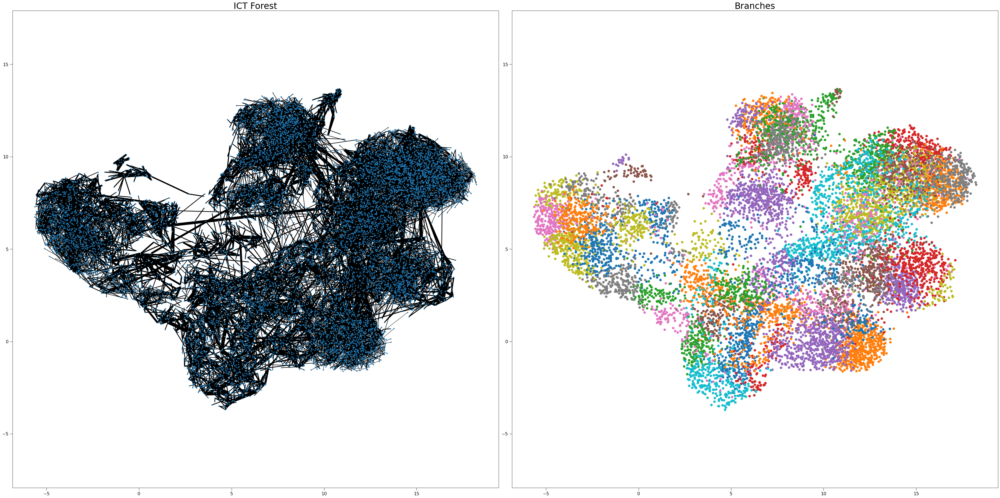

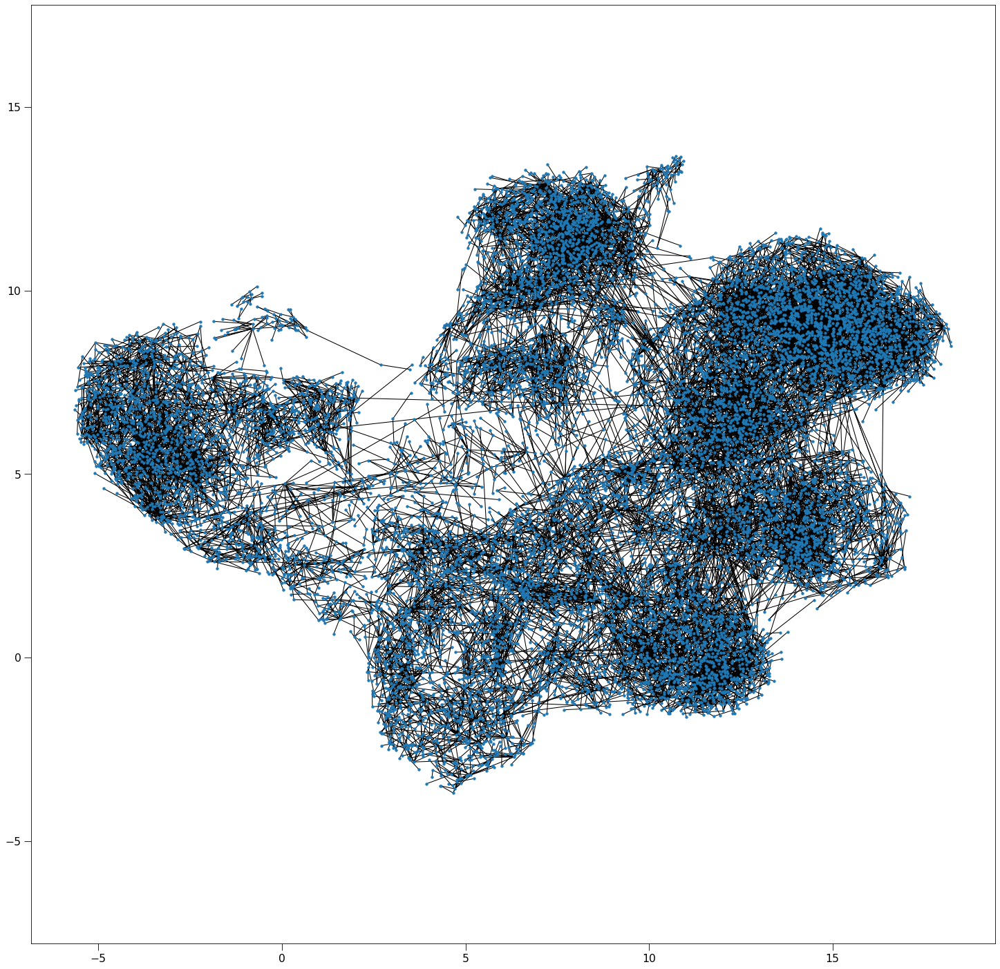

Patching the components together:   0%|          | 0/81 [00:00<?, ?it/s]

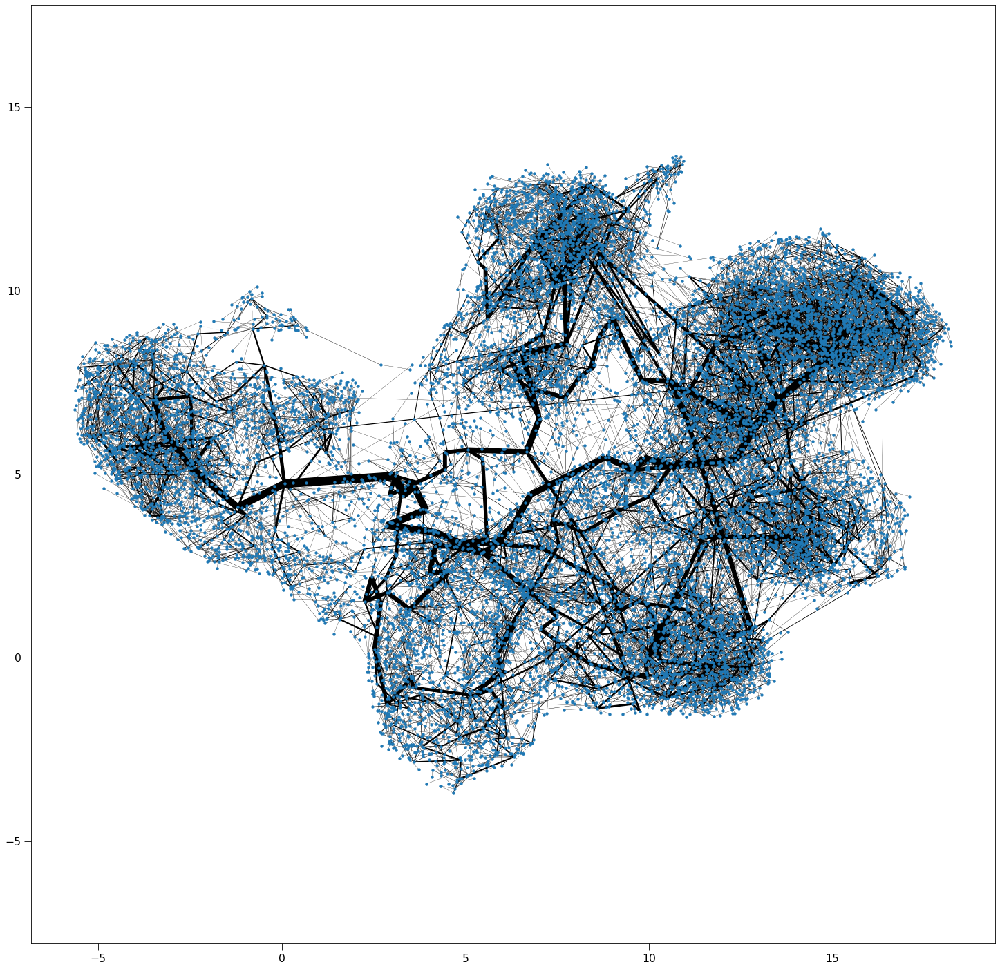

In [10]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()


##############################
           # new #           #
##############################
good_edges = []              #
for u, v in G.iterEdges():   #
    good_edges.append([u,v]) #
############################## 


G = patch_together(G, pca, 11)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [11]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1, good_edges=good_edges)
ICT.indexEdges()

create edgeId array:   0%|          | 0/14332 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/14332 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13657 [00:00<?, ?it/s]

update Arr 14332 -> 13667
update Arr 13667 -> 13666
update Arr 13666 -> 13664
update Arr 13664 -> 13662
update Arr 13662 -> 13661
update Arr 13661 -> 13660
update Arr 13660 -> 13659
update Arr 13659 -> 13659
update Arr 13659 -> 13659
update Arr 13659 -> 13659
update Arr 13659 -> 13658
update Arr 13658 -> 13657
added 11 edges early


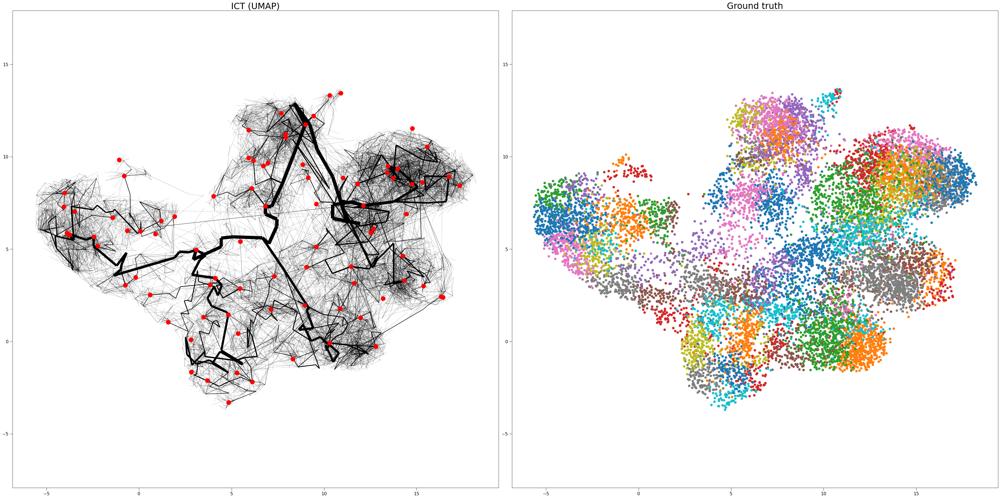

In [12]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

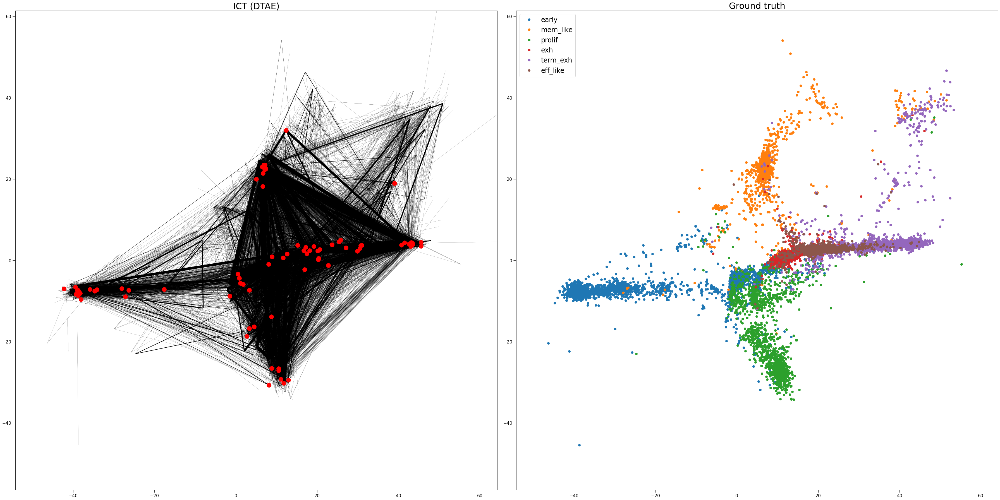

In [13]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

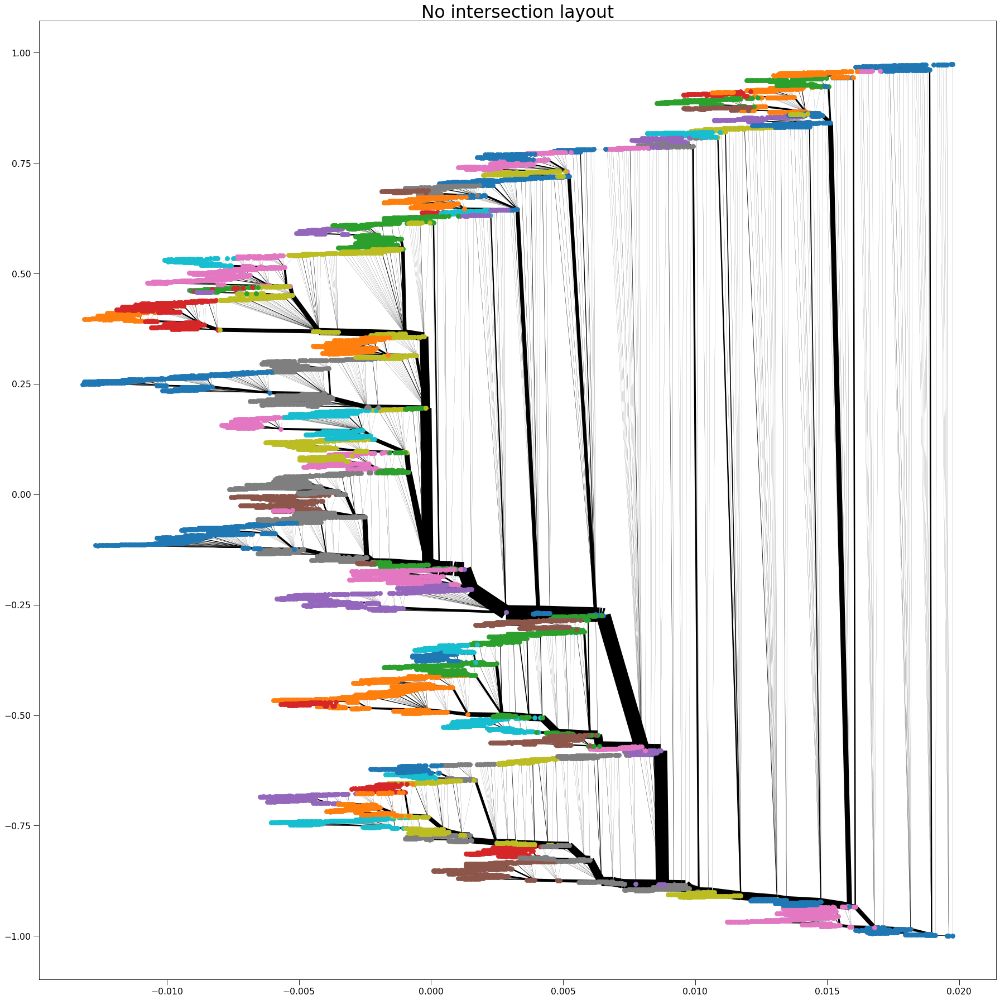

In [14]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()